# Imports

In [1]:
%load_ext autoreload
%autoreload 2

In [42]:
import os
import shutil

import scanpy as sc

from matplotlib.pyplot import rcParams
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
import warnings
# warnings.filterwarnings(action='once')
warnings.filterwarnings('ignore')

In [37]:
import os
import shutil
import pickle

import scanpy as sc
import pandas as pd
import numpy as np
from pathlib import Path

from scipy.optimize import linear_sum_assignment
from scib_metrics.benchmark import Benchmarker

import drvi
from drvi.utils.metrics import DiscreteDisentanglementBenchmark
from drvi_notebooks.utils.data import data_registry, get_data_info
from drvi_notebooks.utils.misc import get_runs_by_model_tags
from drvi_notebooks.utils.method_info import pretify_method_name
from drvi_notebooks.utils.plotting import plot_per_latent_scatter

import wandb

In [5]:
# Simple hack
import IPython.display
from matplotlib_inline.backend_inline import set_matplotlib_formats
IPython.display.set_matplotlib_formats = set_matplotlib_formats
    
sc.set_figure_params(vector_friendly=True, dpi_save=300)

In [6]:
import mplscience
mplscience.available_styles()
mplscience.set_style()

['default', 'despine']


# Config

In [7]:
cwd = os.getcwd()

In [8]:
logs_dir = Path(os.path.expanduser('~/workspace/train_logs'))
logs_dir

PosixPath('/home/icb/amirali.moinfar/workspace/train_logs')

In [9]:
proj_dir = Path(cwd).parent.parent
proj_dir

PosixPath('/lustre/groups/ml01/code/amirali.moinfar/projects/drvi_reproducibility_public')

In [10]:
output_dir = proj_dir / 'plots' / 'immune_analysis'
output_dir.mkdir(parents=True, exist_ok=True)
output_dir

PosixPath('/lustre/groups/ml01/code/amirali.moinfar/projects/drvi_reproducibility_public/plots/immune_analysis')

In [11]:
run_name = 'immune_hvg'
run_version = '4.3'
run_path = os.path.expanduser('~/workspace/train_logs/models')

data_info = get_data_info(run_name, run_version)
wandb_address = data_info['wandb_address']
col_mapping = data_info['col_mapping']
plot_columns = data_info['plot_columns']
pp_function = data_info['pp_function']
data_path = data_info['data_path']
cell_type_key = data_info['cell_type_key']
control_treatment_key = data_info['control_treatment_key']
condition_key = data_info['condition_key']
split_key = data_info['split_key']

In [12]:
cat_10_pallete = sc.plotting.palettes.vega_10_scanpy
cat_10_pallete_without_grey = [c for c in cat_10_pallete if c != '#7f7f7f']
cat_20_pallete = sc.plotting.palettes.vega_20_scanpy
wong_pallete = [
    "#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2", "#D55E00", "#CC79A7", "#000000",
]
cat_100_pallete = sc.plotting.palettes.godsnot_102

## Utils

In [13]:
original_params = plt.rcParams.copy()
def set_font_in_rc_params():
    fs = 16
    plt.rcParams.update({
        'font.size': fs,            # General font size
        'axes.titlesize': fs,       # Title font size
        'axes.labelsize': fs,       # Axis label font size
        'legend.fontsize': fs,      # Legend font size
        'xtick.labelsize': fs,      # X-axis tick label font size
        'ytick.labelsize': fs       # Y-axis tick label font size
    })

## Data

In [14]:
adata = sc.read(data_path)
adata

AnnData object with n_obs × n_vars = 32484 × 2000
    obs: 'batch', 'chemistry', 'data_type', 'dpt_pseudotime', 'final_annotation', 'mt_frac', 'n_counts', 'n_genes', 'sample_ID', 'size_factors', 'species', 'study', 'tissue'
    var: 'gene_de_sig', 'mean', 'std'
    uns: 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'lognorm'
    obsp: 'connectivities', 'distances'

In [15]:
adata_full = sc.read(Path('~/data/misc/Immune_ALL_human.h5ad').expanduser())
adata_full

AnnData object with n_obs × n_vars = 33506 × 12303
    obs: 'batch', 'chemistry', 'data_type', 'dpt_pseudotime', 'final_annotation', 'mt_frac', 'n_counts', 'n_genes', 'sample_ID', 'size_factors', 'species', 'study', 'tissue'
    layers: 'counts'

## Runs to load

All these runs are created by the scripts in `general` and `baseline` directories. You need to run them first.

In [16]:
api = wandb.Api()

wandb: ERROR Failed to detect the name of this notebook. You can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: [wandb.Api()] Loaded credentials for https://api.wandb.ai from /home/icb/amirali.moinfar/.netrc.


In [17]:
api.flush()
RUNS_TO_LOAD = get_runs_by_model_tags(
    api, 
    ["DRVI_runs_adata_hvg_drvi_4.3", "DRVI_runs__DRVI_5.0", "DRVI_runs__DRVI_baselines_2.0"],
    {
        'DRVI': 'Immune_general_analysis_32__DRVI',
        'PCA': 'Immune_general_analysis_32__PCA',
        'ICA': 'Immune_general_analysis_32__ICA',
        'LIGER': 'Immune_general_analysis_32__LIGER',
        'MOFA': 'Immune_general_analysis_32__MOFA',
        'scETM': 'Immune_general_analysis_32__scETM',
        'BTCVAE': 'Immune_general_analysis_32__BTCVAE',
        'MICHIGAN': 'Immune_general_analysis_32__MICHIGAN',
        'DRVI-AP': 'Immune_general_analysis_32__DRVI_AP',
        'scVI': 'Immune_general_analysis_32__scVI',
        'scVI-PCA': 'Immune_general_analysis_32__scVI_PCA',
        'scVI-ICA': 'Immune_general_analysis_32__scVI_ICA',
    },
)


RUNS_TO_LOAD

{'DRVI': [<Run moinfar_proj/DRVI_runs_adata_hvg_drvi_4.3/gwg9u9sv (finished)>],
 'PCA': [<Run moinfar_proj/DRVI_runs__DRVI_baselines_2.0/br7ewmkp (finished)>],
 'ICA': [<Run moinfar_proj/DRVI_runs__DRVI_baselines_2.0/7113idbn (finished)>],
 'LIGER': [<Run moinfar_proj/DRVI_runs__DRVI_baselines_2.0/7yhkfcrf (finished)>],
 'MOFA': [<Run moinfar_proj/DRVI_runs__DRVI_baselines_2.0/l79tb84t (finished)>],
 'scETM': [<Run moinfar_proj/DRVI_runs__DRVI_baselines_2.0/vtfh16s3 (finished)>],
 'BTCVAE': [<Run moinfar_proj/DRVI_runs__DRVI_baselines_2.0/j24nj9mx (finished)>],
 'MICHIGAN': [<Run moinfar_proj/DRVI_runs__DRVI_baselines_2.0/o5d0scvw (finished)>],
 'DRVI-AP': [<Run moinfar_proj/DRVI_runs__DRVI_5.0/dxedb2hj (finished)>],
 'scVI': [<Run moinfar_proj/DRVI_runs__DRVI_5.0/jw7c27io (finished)>],
 'scVI-PCA': [<Run moinfar_proj/DRVI_runs__DRVI_5.0/v1s3scsq (finished)>],
 'scVI-ICA': [<Run moinfar_proj/DRVI_runs__DRVI_5.0/wxkdmi1f (finished)>,
  <Run moinfar_proj/DRVI_runs__DRVI_5.0/02m3ckwi (fin

In [18]:
RUNS_TO_LOAD = {k:v[0] for k,v in RUNS_TO_LOAD.items() if len(v) > 0}
RUNS_TO_LOAD

{'DRVI': <Run moinfar_proj/DRVI_runs_adata_hvg_drvi_4.3/gwg9u9sv (finished)>,
 'PCA': <Run moinfar_proj/DRVI_runs__DRVI_baselines_2.0/br7ewmkp (finished)>,
 'ICA': <Run moinfar_proj/DRVI_runs__DRVI_baselines_2.0/7113idbn (finished)>,
 'LIGER': <Run moinfar_proj/DRVI_runs__DRVI_baselines_2.0/7yhkfcrf (finished)>,
 'MOFA': <Run moinfar_proj/DRVI_runs__DRVI_baselines_2.0/l79tb84t (finished)>,
 'scETM': <Run moinfar_proj/DRVI_runs__DRVI_baselines_2.0/vtfh16s3 (finished)>,
 'BTCVAE': <Run moinfar_proj/DRVI_runs__DRVI_baselines_2.0/j24nj9mx (finished)>,
 'MICHIGAN': <Run moinfar_proj/DRVI_runs__DRVI_baselines_2.0/o5d0scvw (finished)>,
 'DRVI-AP': <Run moinfar_proj/DRVI_runs__DRVI_5.0/dxedb2hj (finished)>,
 'scVI': <Run moinfar_proj/DRVI_runs__DRVI_5.0/jw7c27io (finished)>,
 'scVI-PCA': <Run moinfar_proj/DRVI_runs__DRVI_5.0/v1s3scsq (finished)>,
 'scVI-ICA': <Run moinfar_proj/DRVI_runs__DRVI_5.0/wxkdmi1f (finished)>}

In [19]:
embeds = {}
run_paths = {}
random_order = None
for method_name, run in RUNS_TO_LOAD.items():
    run_path = Path(run.config.get('output_dir', Path(f'~/workspace/train_logs/models/{run.name}').expanduser()))
    run_paths[method_name] = run_path
    print(method_name)
    embed = sc.read(run_path / 'latent.h5ad')
    if random_order is None:
        random_order = embed.obs.sample(frac=1.).index
    embed = embed[random_order].copy()
    embeds[method_name] = embed

DRVI
PCA
ICA
LIGER
MOFA
scETM
BTCVAE
MICHIGAN
DRVI-AP
scVI
scVI-PCA
scVI-ICA


In [20]:
embed_drvi = embeds['DRVI']
model_drvi = drvi.model.DRVI.load(run_paths['DRVI'] / 'model.pt', adata, prefix='v_0_1_0_')
adata.obsm['X_umap_drvi'] = embed_drvi[adata.obs.index].obsm['X_umap']

INFO     File                                                                                                      
         /home/icb/amirali.moinfar/workspace/train_logs/models/drvi_20240430-115959-272081/model.pt/v_0_1_0_model.p
         t already downloaded                                                                                      
INFO     DRVI: The model is trained with DRVI version 0.1.0.                                                       
INFO     DRVI: Updaging data setup config ...                                                                      
INFO     DRVI: Modifying data args from 0.1.10 to 0.1.11 (no user action required)                                 
INFO     DRVI: Adding empty batch key ...                                                                          
INFO     DRVI: Done updating data source registry from 0.1.10 to 0.1.11.                                           
INFO     DRVI: Done updating data source registry. Loading in DRVI versi

In [21]:
embed_new_filename = run_paths['DRVI'] / 'latent_v2_5.h5ad'

if not embed_new_filename.exists():
    embed_drvi.var['title_prev'] = embed_drvi.var['title']
    model_drvi.set_latent_dimension_stats(embed_drvi, vanished_threshold=0.5)
    
    print(np.all(embed_drvi.var['title'] == embed_drvi.var['title_prev']))  # Good. no change of DR orders
    
    model_drvi.calculate_interpretability_scores(embed_drvi, "OOD")
    model_drvi.calculate_interpretability_scores(embed_drvi, "IND")
    
    embed_drvi.write_h5ad(embed_new_filename)
else:
    embeds['DRVI'] = embed_drvi = sc.read_h5ad(embed_new_filename)
embed_drvi

AnnData object with n_obs × n_vars = 32484 × 32
    obs: 'batch', 'chemistry', 'data_type', 'dpt_pseudotime', 'final_annotation', 'mt_frac', 'n_counts', 'n_genes', 'sample_ID', 'size_factors', 'species', 'study', 'tissue', 'log_lib', '_scvi_batch', '_scvi_labels'
    var: 'original_dim_id', 'reconstruction_effect', 'order', 'max_value', 'mean', 'min', 'max', 'std', 'std_abs', 'title', 'vanished', 'vanished_positive_direction', 'vanished_negative_direction'
    uns: 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap', 'qz_mean'
    varm: 'IND_exp_weighted_mean_negative', 'IND_exp_weighted_mean_positive', 'IND_linear_weighted_mean_negative', 'IND_linear_weighted_mean_positive', 'IND_max_negative', 'IND_max_positive', 'OOD_combined_negative', 'OOD_combined_positive', 'OOD_max_possible_negative', 'OOD_max_possible_positive', 'OOD_min_possible_negative', 'OOD_min_possible_positive', 'PCs'
    obsp: 'connectivities', 'distances'

# Heatmaps for all models

In [22]:
version = DiscreteDisentanglementBenchmark.version

for method_name, embed in embeds.items():
    print(method_name)
    bench_filename = run_paths[method_name] / f'disentanglement_metrics_{version}.pkl'
    if not bench_filename.exists():
        bench = DiscreteDisentanglementBenchmark(embed.X, discrete_target=embed.obs[cell_type_key])
        bench.evaluate()
        print(bench.get_results())
        bench.save(bench_filename)

DRVI
PCA
ICA
LIGER
MOFA
scETM
BTCVAE
MICHIGAN
DRVI-AP
scVI
scVI-PCA
scVI-ICA


In [23]:
embed_subset = drvi.utils.pl.make_balanced_subsample(embeds['DRVI'], cell_type_key, min_count=20)
unique_plot_cts = [
    'CD4+ T cells',
    'CD8+ T cells',
    'NK cells',
    'NKT cells',
    'CD10+ B cells',
    'CD20+ B cells',
    'CD14+ Monocytes',
    'CD16+ Monocytes',
    'Plasma cells',
    'Erythrocytes',
    'Erythroid progenitors',
    'Megakaryocyte progenitors',
    'Monocyte progenitors',
    'Monocyte-derived dendritic cells',
    'Plasmacytoid dendritic cells',
    'HSPCs',
]

DRVI


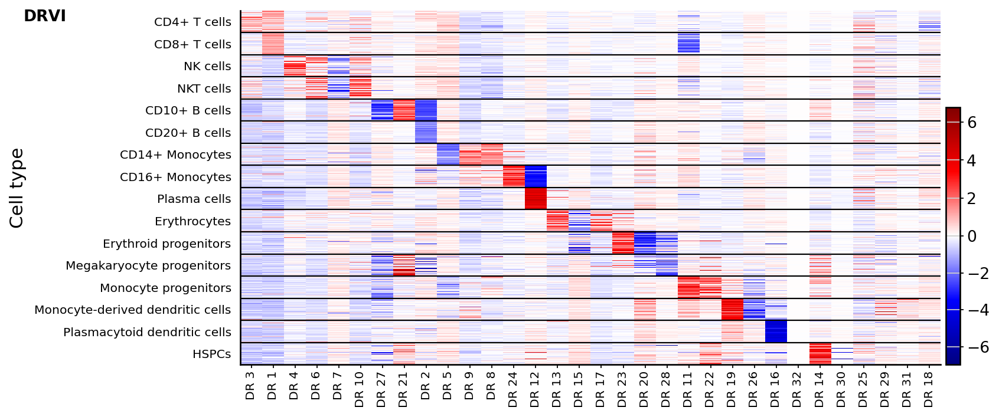

PCA


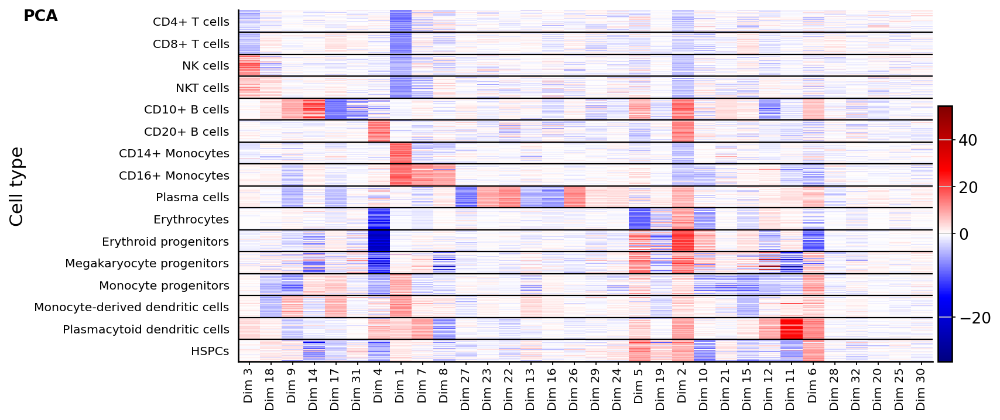

ICA


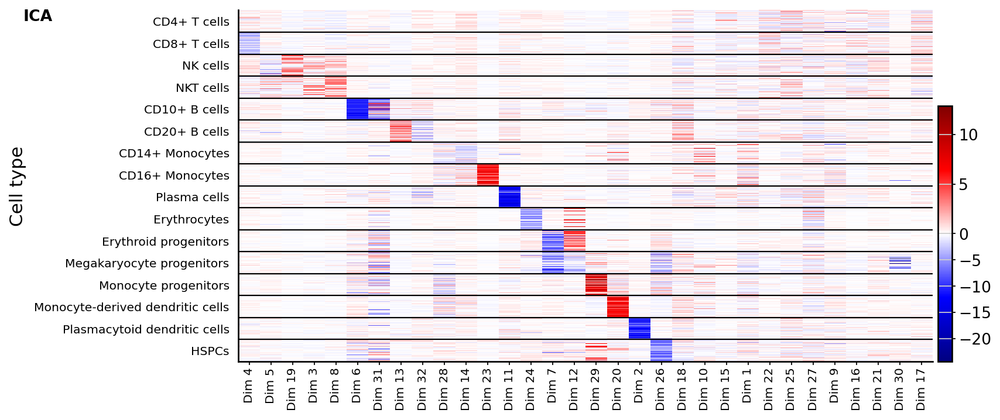

LIGER


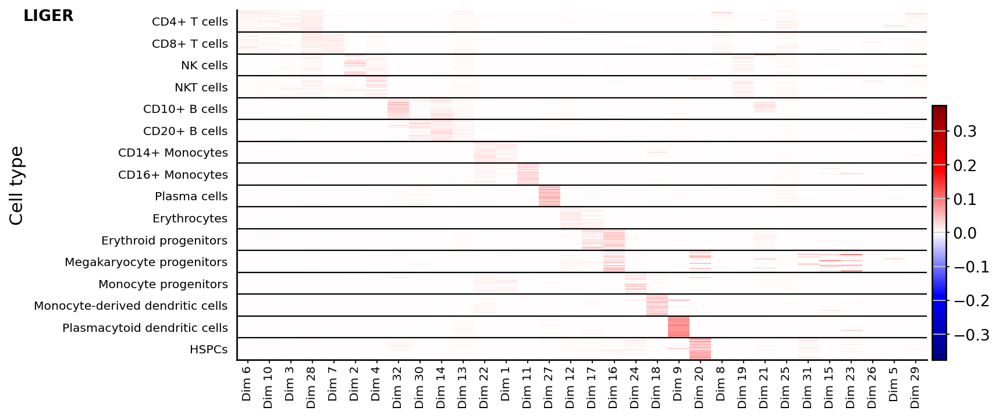

MOFA


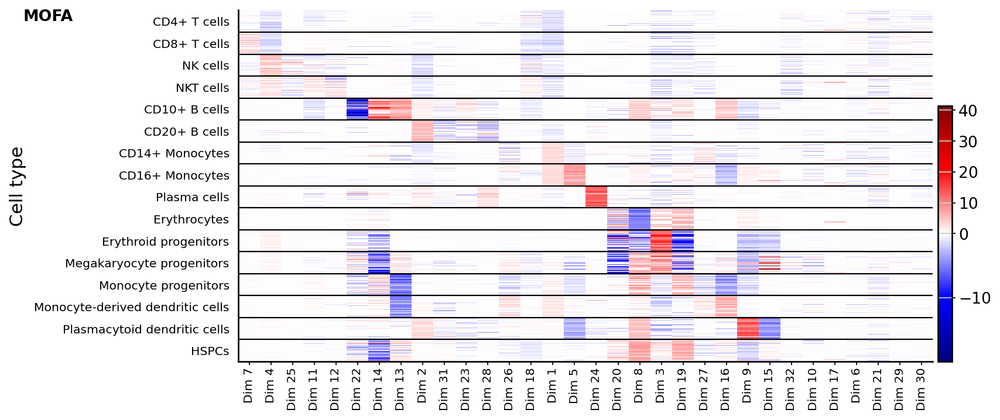

scETM


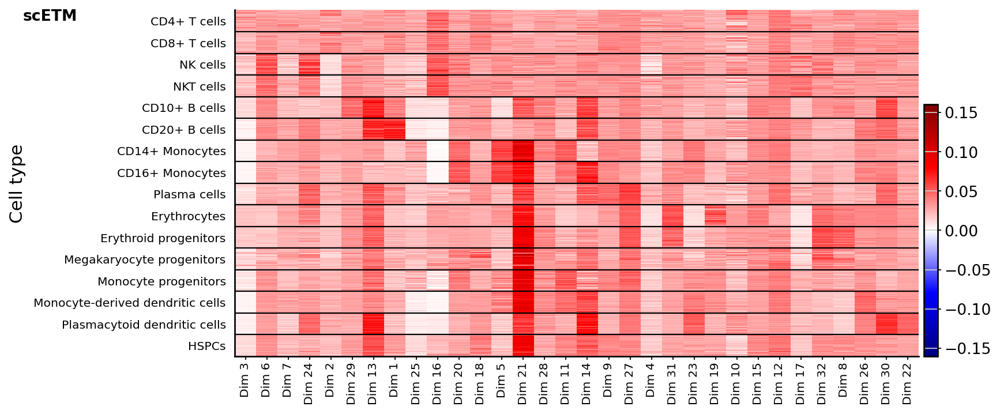

BTCVAE


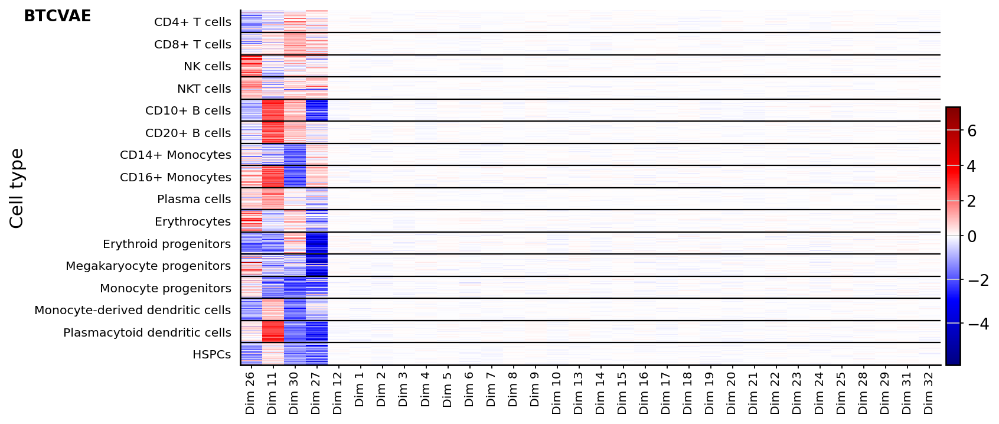

MICHIGAN


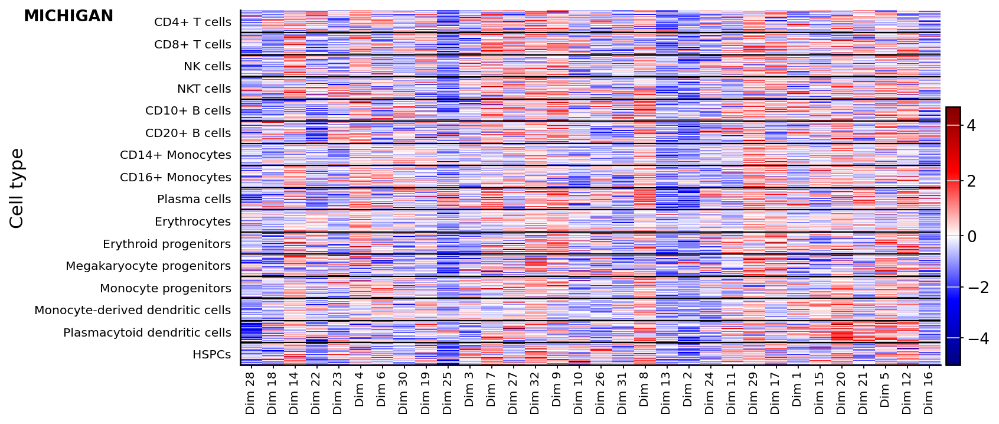

DRVI-AP


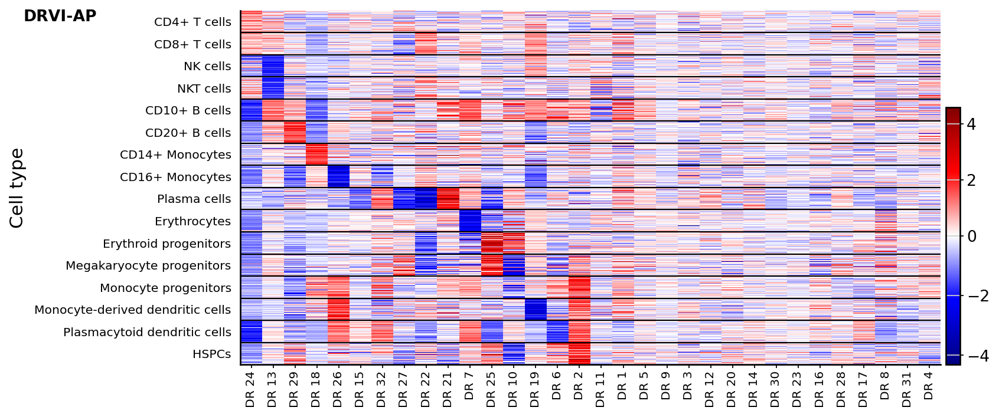

scVI


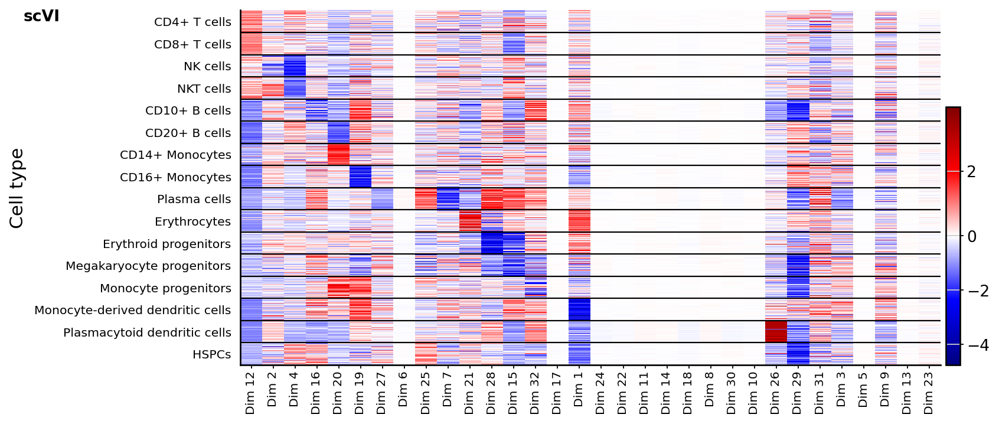

scVI-PCA


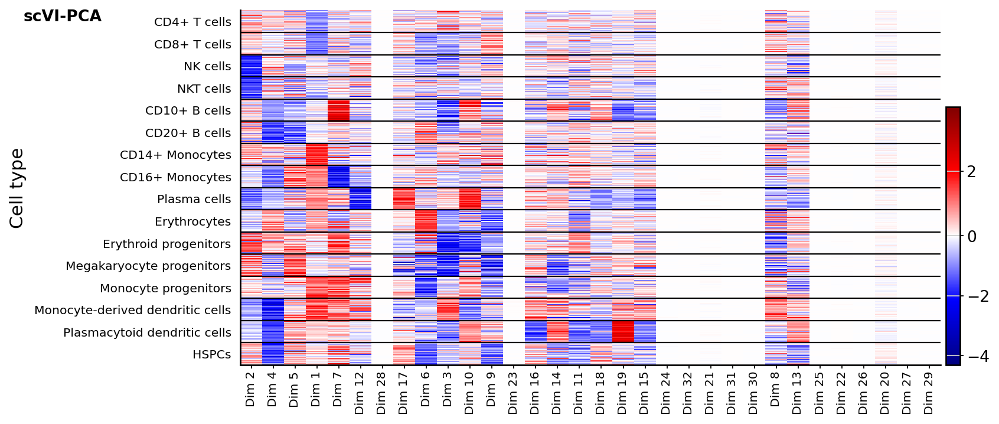

scVI-ICA


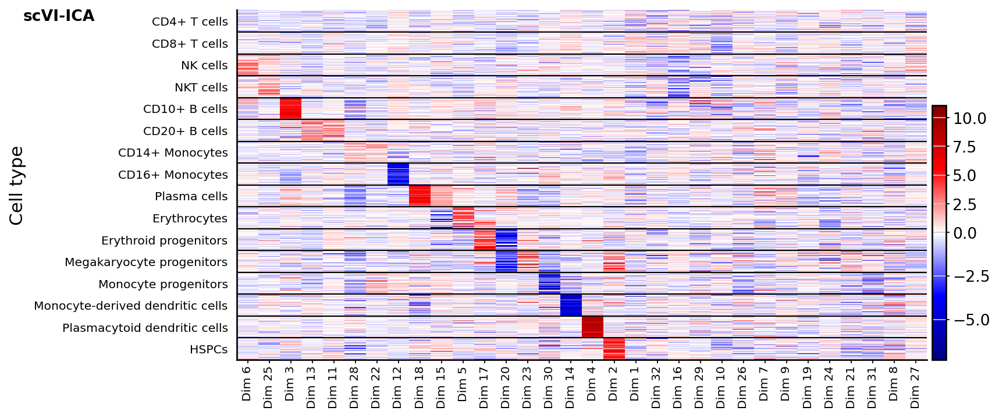

In [24]:
for method_name, embed in embeds.items():
    print(method_name)

    bench_filename = run_paths[method_name] / f'disentanglement_metrics_{version}.pkl'
    bench = DiscreteDisentanglementBenchmark.load(bench_filename, embed.X, discrete_target=embed.obs[cell_type_key], one_hot_target=None)
    sim_matrix = bench.get_results_details()['SMI'][unique_plot_cts].copy()
    
    k = cell_type_key
    unique_values = list(sorted(list(embed.obs[k].astype(str).unique())))
    method_embed_subset = embed[embed_subset.obs.index].copy()
    method_embed_subset.obs[cell_type_key] = pd.Categorical(method_embed_subset.obs[cell_type_key], unique_plot_cts)
    embed_subset = embed_subset[np.argsort(method_embed_subset.obs[cell_type_key].cat.codes)]
    method_embed_subset.uns[k + "_colors"] = 'black'
    vars = method_embed_subset.var
    vars['van'] = ~ (np.abs(method_embed_subset.X).max(axis=0, keepdims=True) > np.abs(method_embed_subset.X).max() / 5).flatten()
    vars['van'] = np.logical_and(vars['van'], (sim_matrix.max(axis=1) < 0.1).values)
    sim_matrix = (sim_matrix + 0.1) * (~(vars['van'].values[:, np.newaxis]))
    vars['plot_order'] = np.hstack([sim_matrix, sim_matrix * 0.01 + 0.3]).argmax(axis=1).tolist()
    if 'title' not in vars.columns:
        vars['title'] = np.char.add('Dim ', (1 + np.arange(method_embed_subset.n_vars)).astype(str))
        vars['order'] = np.arange(method_embed_subset.n_vars)
    vars['not_interesting'] = np.logical_or(vars['van'], vars['plot_order']==sim_matrix.shape[1])
    vars = pd.concat([vars.query('~not_interesting').sort_values('plot_order'), vars.query('not_interesting').sort_values('order')])
    fig = sc.pl.heatmap(
        method_embed_subset,
        vars['title'],
        k,
        gene_symbols = 'title',
        layer=None,
        # var_group_positions=[(0,30), (31, 51), (52, 63)],
        # var_group_labels=['Cell-type indicator', 'Biological Process', 'Vanished'],
        # var_group_rotation=0,
        figsize=(10, 5),
        show_gene_labels=True,
        dendrogram=False,
        vcenter=0,
        cmap=drvi.utils.pl.cmap.saturated_red_blue_cmap, show=False,
        # swap_axes=True,
    )
    fig['groupby_ax'].set_ylabel('Cell type')
    # fig['groupby_ax'].set_xlabel('')
    fig['groupby_ax'].get_images()[0].remove()
    pos = fig['groupby_ax'].get_position()
    pos.x0 += 0.015
    fig['groupby_ax'].set_position(pos)
    # fig['heatmap_ax'].yaxis.tick_right()
    # cbar = fig['heatmap_ax'].figure.get_axes()[-1]
    # pos = cbar.get_position()
    # # cbar.set_position([1., 0.77, 0.01, 0.13])
    # cbar.set_position([.95, 0.001, 0.01, 0.14])

    ax = fig['heatmap_ax']
    ax.set_ylabel('')
    ax.text(-0.31, 0.97, pretify_method_name(method_name), size=12, ha='left', weight='bold', color='black', rotation=0, transform=ax.transAxes)

    plt.savefig(output_dir / f"ct_vs_dim_heatmap_rotated_{method_name}.pdf", bbox_inches='tight')
    plt.show()

# UMAPs of all models

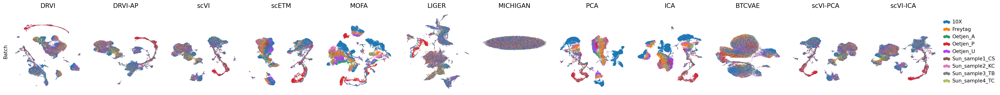

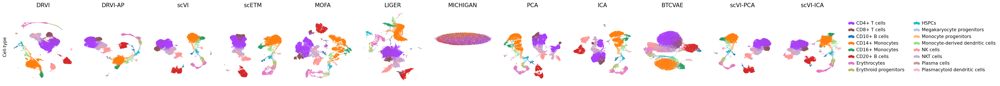

In [25]:
size = 3
methods_to_plot = ["DRVI", "DRVI-AP", "scVI", "scETM", "MOFA", "LIGER", "MICHIGAN", "PCA", "ICA", "BTCVAE", "scVI-PCA", "scVI-ICA",]

# n_col = len(embeds)
n_col = len(methods_to_plot)
for _, col in enumerate(plot_columns):
    fig,axs=plt.subplots(1, n_col,
                     figsize=(n_col * size, 1 * size),
                     sharey='row', squeeze=False)
    j = 0
    # for i, (method_name, embed) in enumerate(embeds.items()):
    for i, method_name in enumerate(methods_to_plot):
        embed = embeds[method_name]
    
        pos = (-0.1, 0.5)
        
        ax = axs[j, i]
        unique_values = list(sorted(list(embed.obs[col].astype(str).unique())))
        # if len(unique_values) <= 8:
        #     palette = dict(zip(unique_values, wong_pallete))
        if len(unique_values) <= 10:
            palette = dict(zip(unique_values, cat_10_pallete))
        elif len(unique_values) <= 20:
            palette = dict(zip(unique_values, cat_20_pallete))
        elif len(unique_values) <= 102:
            palette = dict(zip(unique_values, cat_100_pallete))
        else:
            palette = None
        sc.pl.umap(embed, color=col, 
                   palette=palette, 
                   ax=ax, show=False, frameon=False, title='' if j != 0 else pretify_method_name(method_name), 
                   legend_loc='none' if i != n_col - 1 else 'right margin',
                   colorbar_loc=None if i != n_col - 1 else 'right')
        if len(unique_values) > 30:
            if i == n_col - 1:
                ax.legend(ncol=len(unique_values)//15+1, bbox_to_anchor=(1.1, 1.05))
        if i == 0:
            ax.annotate(col_mapping[col], zorder=100, fontsize=12,
                        xy=pos, xytext=pos, textcoords='axes fraction', rotation='vertical', va='center', ha='center')

    plt.subplots_adjust(left=0.1,
                        bottom=0.05,
                        right=0.95,
                        top=0.95,
                        wspace=0.1,
                        hspace=0.1)
    
    plt.savefig(output_dir / f'umaps_for_all_runs_{col}.pdf', bbox_inches='tight')


## DRVI

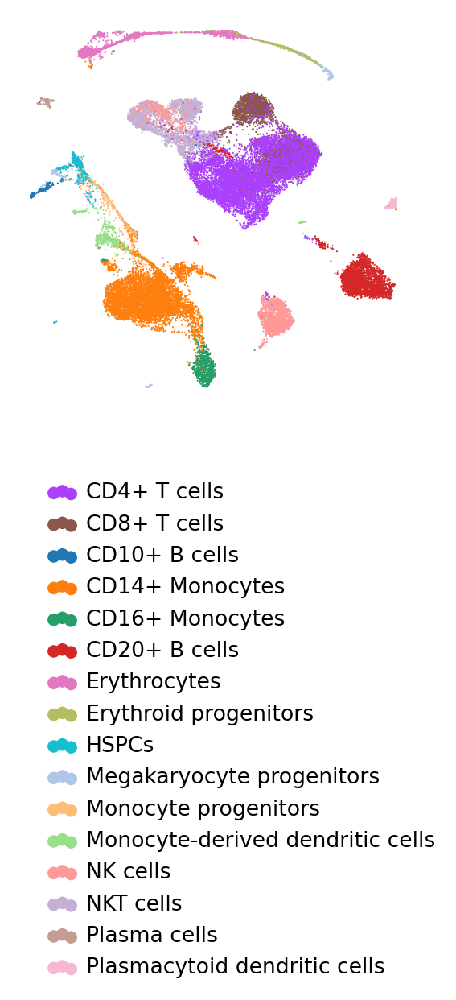

In [49]:
col = cell_type_key
unique_values = list(sorted(list(embed.obs[col].astype(str).unique())))
palette = dict(zip(unique_values, cat_20_pallete))
fig = sc.pl.umap(embed_drvi, color=col, 
                 palette = palette, 
                 show=False, frameon=False, title='', 
                 legend_loc='right margin',
                 colorbar_loc=None,
                 return_fig=True)


plt.legend(ncol=1, bbox_to_anchor=(1.1, -.15))
fig.savefig(output_dir / f'drvi_umap.pdf', bbox_inches='tight', dpi=300)

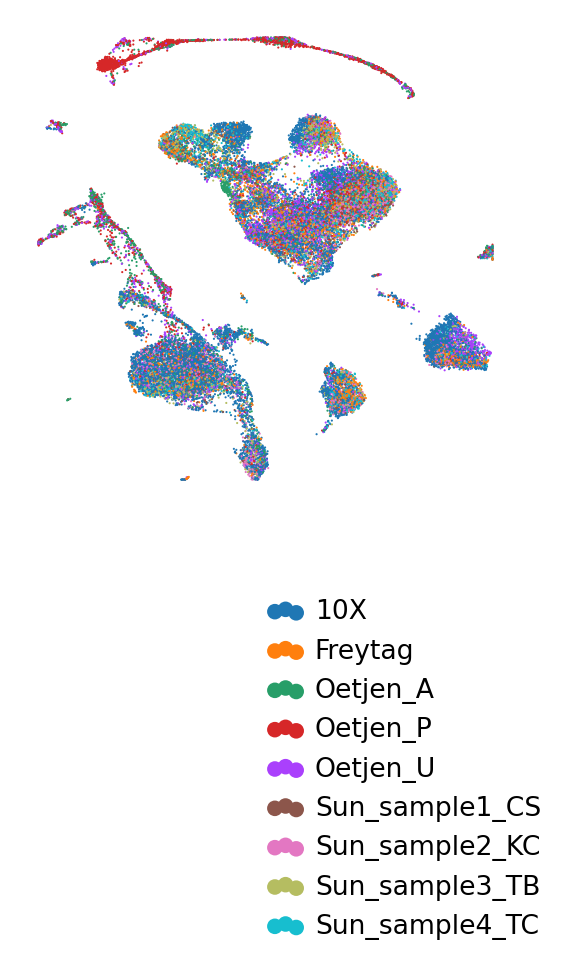

In [22]:
col = condition_key
unique_values = list(sorted(list(embed.obs[col].astype(str).unique())))
palette = dict(zip(unique_values, cat_20_pallete))
fig = sc.pl.umap(embed_drvi, color=col, 
                 palette = palette, 
                 show=False, frameon=False, title='', 
                 legend_loc='right margin',
                 colorbar_loc=None,
                 return_fig=True)


plt.legend(ncol=1, bbox_to_anchor=(1.1, -.15))
fig.savefig(output_dir / f'drvi_umap_batch.pdf', bbox_inches='tight', dpi=300)

# Analysis pipeline

In [50]:
model = model_drvi
embed = embed_drvi

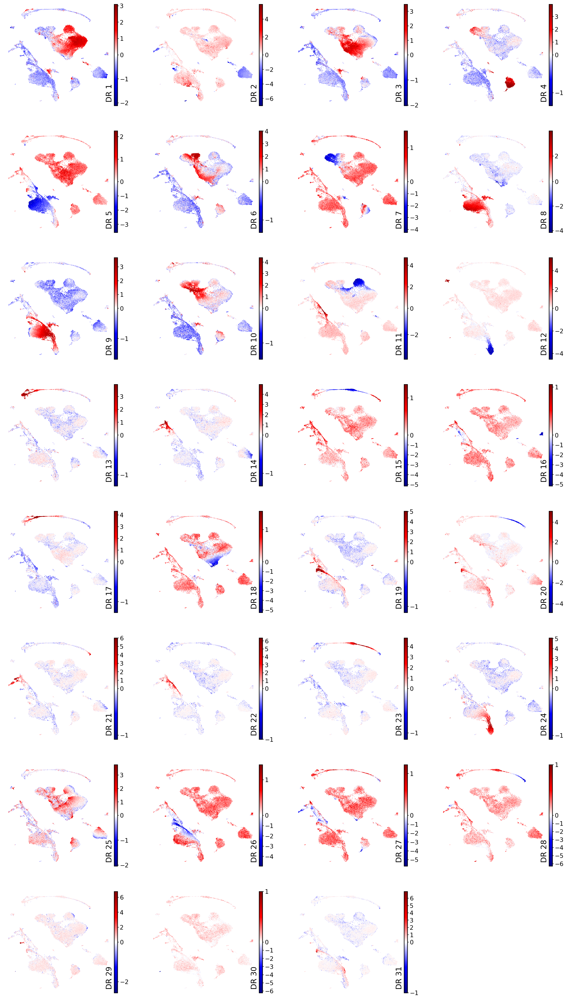

In [51]:
fig = drvi.utils.pl.plot_latent_dims_in_umap(embed, directional=False, show=False)
fig.savefig(output_dir / f'drvi_red_blue_umaps.pdf', bbox_inches='tight', dpi=300)

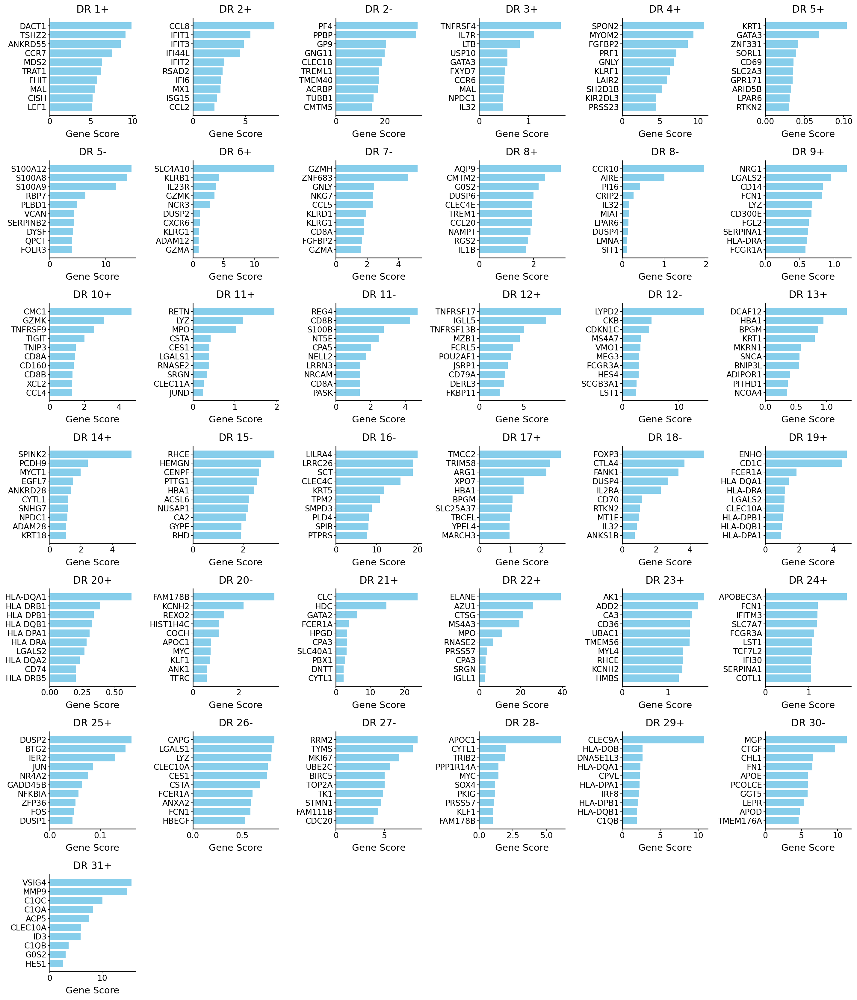

In [79]:
fig = model.plot_interpretability_scores(embed, adata, score_threshold=0.1, show=False, ncols=6,)
fig.savefig(output_dir / f'interpretability_all.pdf', bbox_inches='tight', dpi=300)

In [63]:
int_df = model.get_interpretability_scores(embed, adata)

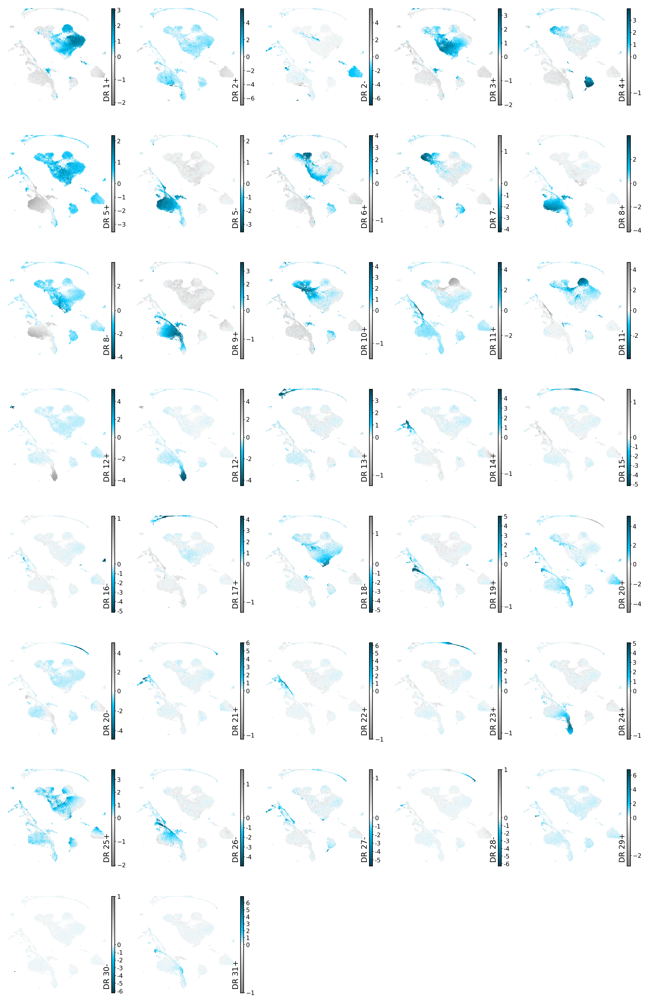

In [65]:
dim_subset = int_df.max(axis=0) >= 0.1
dim_subset = dim_subset[dim_subset].index.tolist()
fig = drvi.utils.pl.plot_latent_dims_in_umap(embed, directional=True, ncols=5, show=False, wspace=0.1, hspace=0.25, color_bar_rescale_ratio=0.95,
                                             dim_subset=dim_subset)
fig.savefig(output_dir / f'interpretable_dims_latents_on_umap.pdf', bbox_inches='tight', dpi=300)
plt.show()

## Visualize Example dimensions

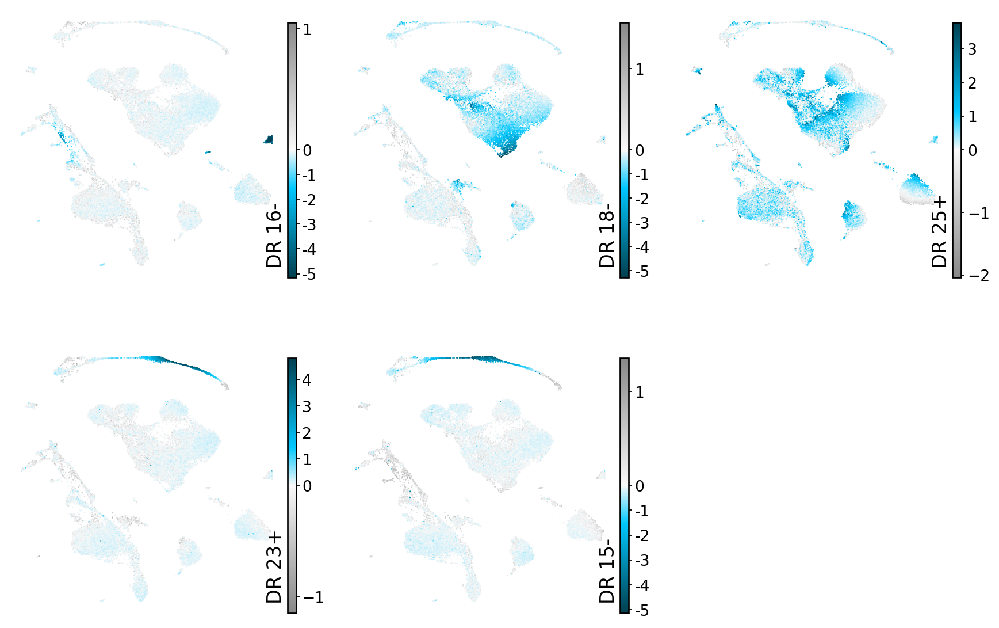

In [80]:
fig = drvi.utils.pl.plot_latent_dims_in_umap(embed, directional=True, ncols=3, show=False, wspace=0.1, hspace=0.25, color_bar_rescale_ratio=0.95,
                                             dim_subset=['DR 16-', 'DR 18-', 'DR 25+', 'DR 23+', 'DR 15-'])
fig.savefig(output_dir / f'drvi_interesting_latents_on_umap.pdf', bbox_inches='tight', dpi=300)
plt.show()

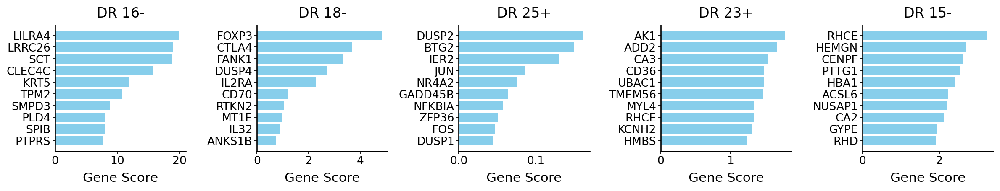

In [81]:
fig = model.plot_interpretability_scores(embed, adata, score_threshold=0.1, ncols=6, show=False,
                                         dim_subset=['DR 16-', 'DR 18-', 'DR 25+', 'DR 23+', 'DR 15-'])
fig.savefig(output_dir / f'drvi_interesting_latents_interpretability.pdf', bbox_inches='tight', dpi=300)
plt.show()

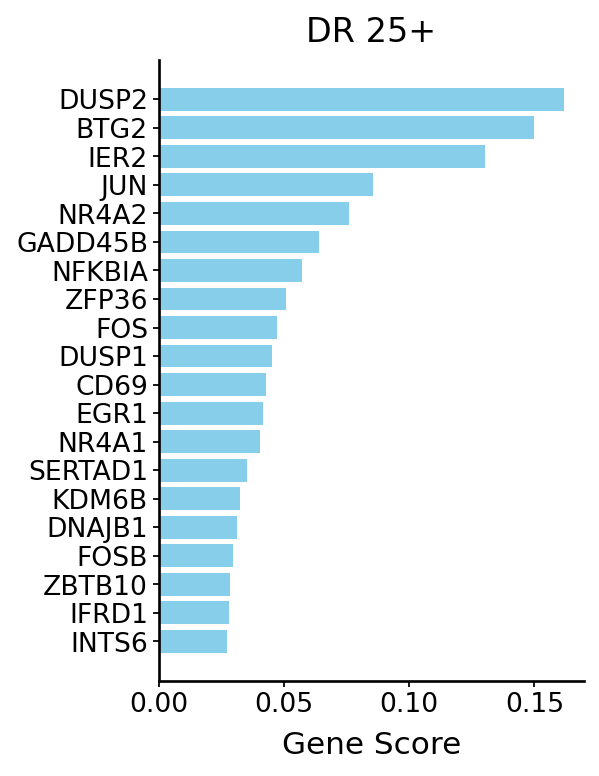

In [82]:
# Rest of the relevant genes for DR 26+ relevant to dissociation stress response
fig = model.plot_interpretability_scores(embed, adata, score_threshold=0.1, ncols=6, show=False,
                                         dim_subset=['DR 25+'], n_top_genes=20,)

## Pair plot for lineage example

plotting Dim 12, Dim 5


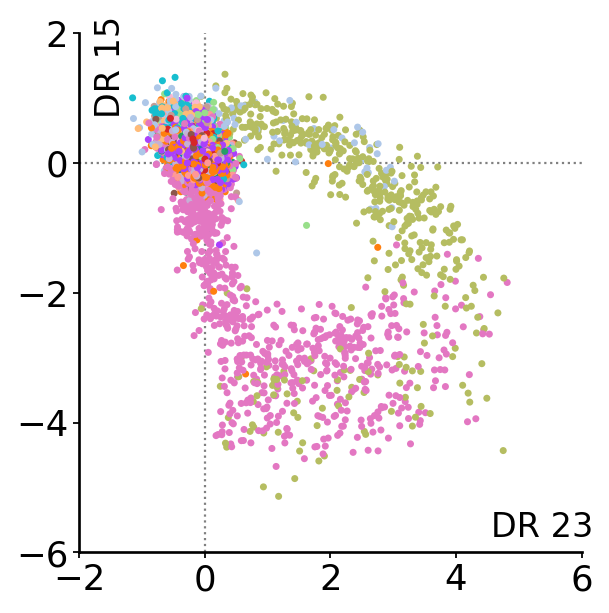

End of latent plots


In [83]:
def save_fn(fig, dim_i, dim_j, original_col):
    dir_name = output_dir
    dir_name.mkdir(parents=True, exist_ok=True)
    fig.savefig(dir_name / f'fig1_joint_plot_{original_col}_{dim_i}_{dim_j}.pdf', bbox_inches='tight', dpi=300)

def pp_fn(g):
    g.ax_marg_x.set_xlim(-2, 6)
    g.ax_marg_y.set_ylim(-6, 2)
    g.ax_marg_x.remove()
    g.ax_marg_y.remove()
    g.ax_joint.get_legend().remove()
    text = g.ax_joint.xaxis.get_label().get_text()
    if text == 'Dim 12':
        text = 'DR 23'
    g.ax_joint.text(0.82, 0.03, text, size=15, ha='left', color='black', rotation=0, transform=g.ax_joint.transAxes)
    text =  g.ax_joint.yaxis.get_label().get_text()
    if text == 'Dim 5':
        text = 'DR 15'
    g.ax_joint.text(0.03, 0.85, text, size=15, ha='left', color='black', rotation=90, transform=g.ax_joint.transAxes)
    plt.xlabel('', axes=g.ax_joint)
    plt.ylabel('', axes=g.ax_joint)

set_font_in_rc_params()
plot_per_latent_scatter(embed, [cell_type_key], col_mapping, xy_limit=5.5, dimensions=[[11, 4]], s=10, alpha=1, plot_height=5.,
                        save_fn=save_fn, pp_fn=pp_fn, zero_lines=True)
plt.rcParams.update(original_params)

## Annotation improvement

In [140]:
model = model_drvi
embed = embed_drvi

In [141]:
adata_aligned = adata_full[embed.obs.index].copy()
adata_aligned.X = adata_aligned.layers['counts'].copy()
sc.pp.normalize_total(adata_aligned, target_sum=1e4)
sc.pp.log1p(adata_aligned)
adata_aligned.layers['log1p'] = adata_aligned.X.copy()
adata_aligned.X = adata_aligned.layers['counts'].copy()

adata_aligned.obsm['X_umap_drvi'] = embed[adata_aligned.obs.index].obsm['X_umap']

adata_aligned

AnnData object with n_obs × n_vars = 32484 × 12303
    obs: 'batch', 'chemistry', 'data_type', 'dpt_pseudotime', 'final_annotation', 'mt_frac', 'n_counts', 'n_genes', 'sample_ID', 'size_factors', 'species', 'study', 'tissue'
    uns: 'log1p'
    obsm: 'X_umap_drvi'
    layers: 'counts', 'log1p'

In [62]:
from matplotlib.colors import LinearSegmentedColormap

cmap_data = {
    "red": ((0.0, 0.0, 136 / 255), (0.5, 235 / 256, 235 / 256), (0.65, 0.0, 0.0), (1.0, 0.0, 0.0)),
    "green": ((0.0, 0.0, 136 / 255), (0.5, 235 / 256, 235 / 256), (0.65, 200 / 255, 200 / 255), (1.0, 63 / 255, 0.0)),
    "blue": ((0.0, 0.0, 136 / 255), (0.5, 235 / 256, 235 / 256), (0.65, 255 / 255, 255 / 255), (1.0, 80 / 255, 0.0)),
}

more_gray_saturated_sky_cmap = LinearSegmentedColormap("SaturatedSky", cmap_data)

In [143]:
dim_subset = ['DR 30-']

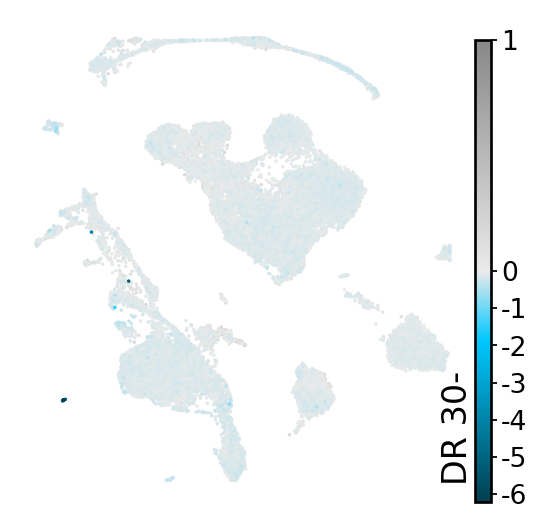

In [144]:
fig = drvi.utils.pl.plot_latent_dims_in_umap(embed, directional=True, ncols=3, show=False, wspace=0.1, hspace=0.25, color_bar_rescale_ratio=0.95,
                                             dim_subset=dim_subset, cmap=more_gray_saturated_sky_cmap, size=10)
fig.savefig(output_dir / f'drvi_additional_interesting_latents_on_umap_fib.pdf', bbox_inches='tight', dpi=300)
plt.show()

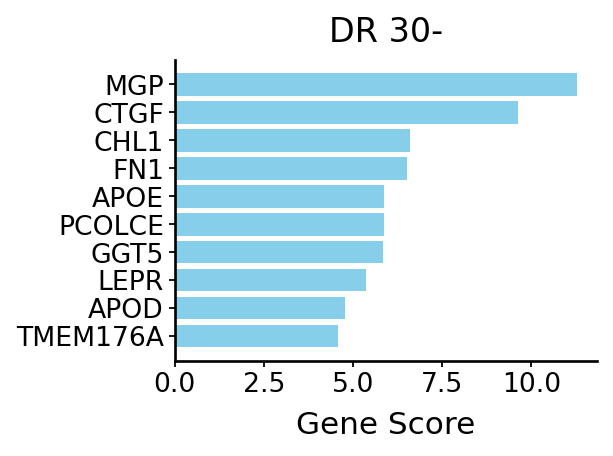

In [145]:
fig = model.plot_interpretability_scores(embed, adata, score_threshold=0.1, ncols=6, show=False,
                                         dim_subset=['DR 30-'])
fig.savefig(output_dir / f'drvi_additional_interesting_latents_interpretability_fib.pdf', bbox_inches='tight', dpi=300)
plt.show()

In [146]:
cutoff = np.abs(embed[:, embed.var['title'] == dim_subset[0][:-1]].X).max() / 2
adata_aligned.obs['Subset status'] = np.where(embed[adata_aligned.obs.index, embed.var[embed.var['title'] == dim_subset[0][:-1]].index].X.flatten()
                                      < -cutoff, 'Fibroblasts', 'other')
adata_aligned.obs['Subset status']

index
TACGGGCGTCTCACCT-1-Oetjen_U          other
GTCTACCAGATGTTAG-1-10X               other
CATGGCGTCTTGCATT-1-Freytag           other
ACTACGAAGAATAACC-1-10X               other
TGGGATTCAAAGAACT-1-10X               other
                                     ...  
AAAGGGCTCCTGGGAC-1-10X               other
GCGCAGTCAATCGGTT-1-Oetjen_A          other
TTGGGTATCGTGGCTG-1-10X               other
CACCTTGGTATCAGTC-1-Sun_sample3_TB    other
TCAATCTTCGCGTTTC-1-Freytag           other
Name: Subset status, Length: 32484, dtype: object

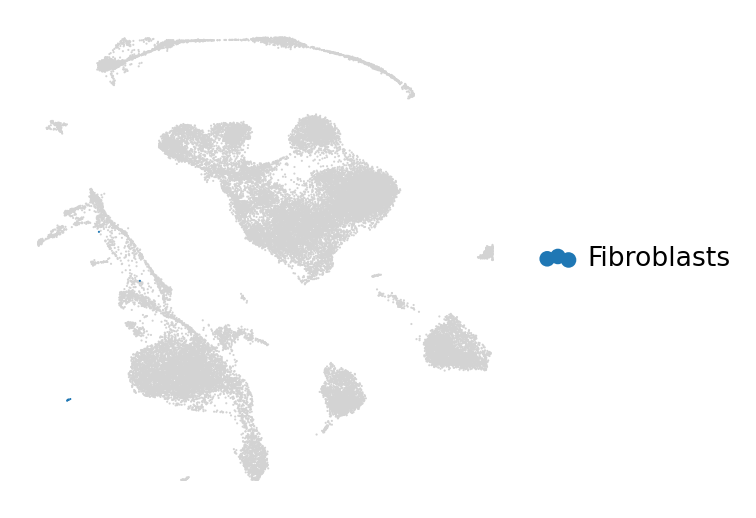

In [147]:
sc.pl.embedding(adata_aligned, basis='X_umap_drvi', color=['Subset status'], groups=['Fibroblasts'], 
                title='', frameon=False, show=False, na_in_legend=False)
plt.savefig(output_dir / f'drvi_additional_interesting_latents_umap_annot_fib.pdf', bbox_inches='tight', dpi=300)
plt.show()

In [148]:
adata_aligned[adata_aligned.obs['Subset status'] == 'Fibroblasts'].obs[cell_type_key].value_counts()

final_annotation
HSPCs                               10
Megakaryocyte progenitors            1
Monocyte-derived dendritic cells     1
Name: count, dtype: int64

In [149]:
adata_aligned.obs['new_cell_type'] = np.where(
    adata_aligned.obs['Subset status'] == 'Fibroblasts',
    # adata_aligned.obs[cell_type_key].astype(str) + ' -> Fibroblasts',
    'Fibroblasts',
    adata_aligned.obs[cell_type_key],
)

In [150]:
ct_order = [
    'Fibroblasts',
    'HSPCs',
    'Erythroid progenitors',
    'Megakaryocyte progenitors',
    'Monocyte-derived dendritic cells',
]

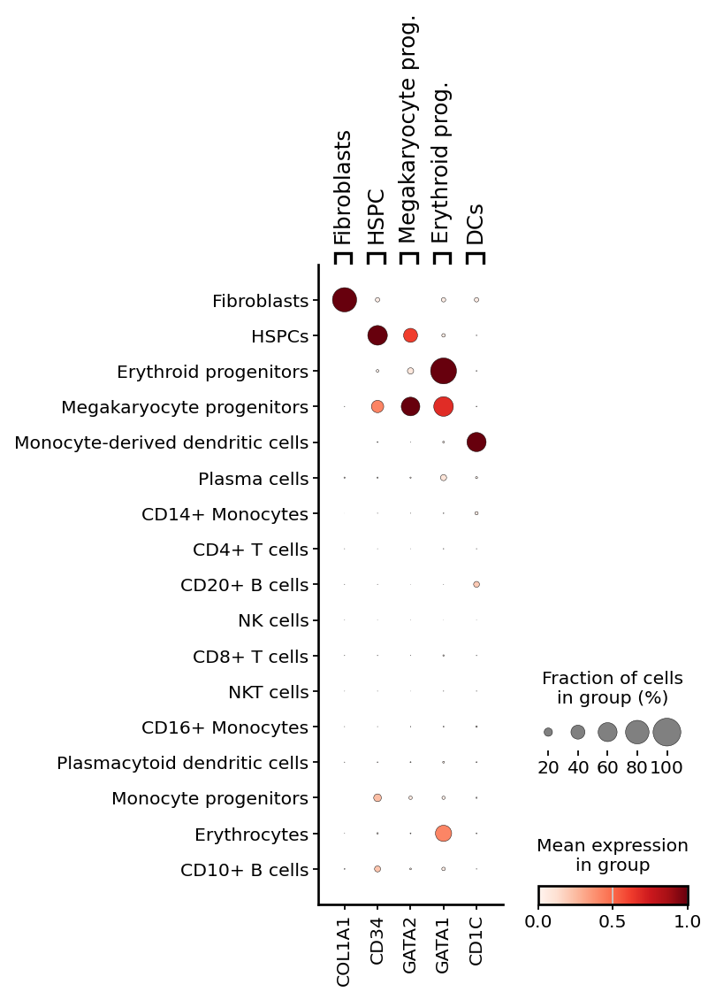

In [151]:
marker_genes_for_mast = {
    'Fibroblasts': ['COL1A1'],
    'HSPC': ['CD34'],
    'Megakaryocyte prog.': ['GATA2'],
    'Erythroid prog.': ['GATA1'],
    'DCs': ['CD1C'],
}
sc.pl.dotplot(adata_aligned, marker_genes_for_mast, groupby='new_cell_type', standard_scale='var', layer='log1p',
              categories_order=ct_order + [c for c in adata_aligned.obs['new_cell_type'].unique() if c not in ct_order], show=False)
plt.savefig(output_dir / f'drvi_additional_interesting_latents_dotplot_fib.pdf', bbox_inches='tight', dpi=300)
plt.show()

In [156]:
dim_subset = ['DR 19+', 'DR 29+', 'DR 16-']

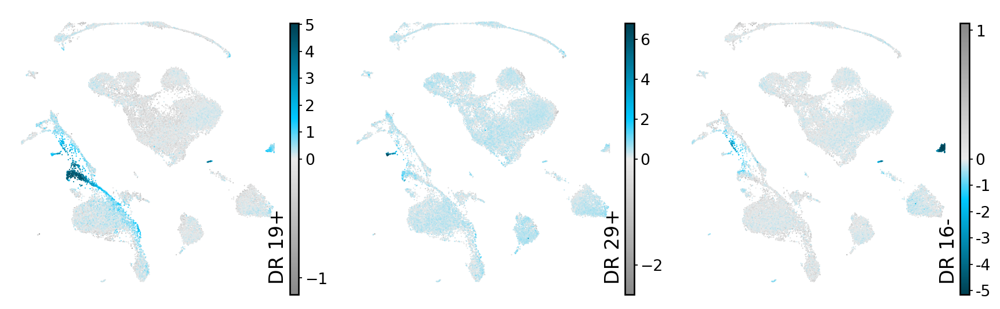

In [157]:
fig = drvi.utils.pl.plot_latent_dims_in_umap(embed, directional=True, ncols=3, show=False, wspace=0.1, hspace=0.25, color_bar_rescale_ratio=0.95,
                                             dim_subset=dim_subset, cmap=more_gray_saturated_sky_cmap)
fig.savefig(output_dir / f'drvi_additional_interesting_latents_on_umap_DCs.pdf', bbox_inches='tight', dpi=300)
plt.show()

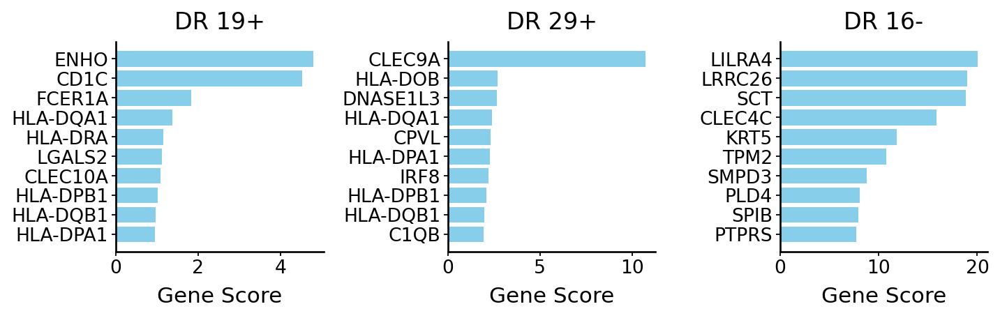

In [158]:
fig = model.plot_interpretability_scores(embed, adata, score_threshold=0.1, ncols=6, show=False,
                                         dim_subset=dim_subset)
fig.savefig(output_dir / f'drvi_additional_interesting_latents_interpretability_DCs.pdf', bbox_inches='tight', dpi=300)
plt.show()

In [159]:
adata_aligned.obs['Subset status'] = np.where(
    adata_aligned.obs[cell_type_key].isin(['Monocyte-derived dendritic cells']),
    np.where(
        embed[adata_aligned.obs.index, embed.var[embed.var['title'] == dim_subset[1][:-1]].index].X.flatten() > 3, 'DC1', 
        np.where(
            embed[adata_aligned.obs.index, embed.var[embed.var['title'] == dim_subset[2][:-1]].index].X.flatten() < -3, 'pDC',
            'DC2'
        )
    ),
    'other'
)
adata_aligned.obs['Subset status']

index
TACGGGCGTCTCACCT-1-Oetjen_U          other
GTCTACCAGATGTTAG-1-10X               other
CATGGCGTCTTGCATT-1-Freytag           other
ACTACGAAGAATAACC-1-10X               other
TGGGATTCAAAGAACT-1-10X               other
                                     ...  
AAAGGGCTCCTGGGAC-1-10X               other
GCGCAGTCAATCGGTT-1-Oetjen_A          other
TTGGGTATCGTGGCTG-1-10X               other
CACCTTGGTATCAGTC-1-Sun_sample3_TB    other
TCAATCTTCGCGTTTC-1-Freytag           other
Name: Subset status, Length: 32484, dtype: object

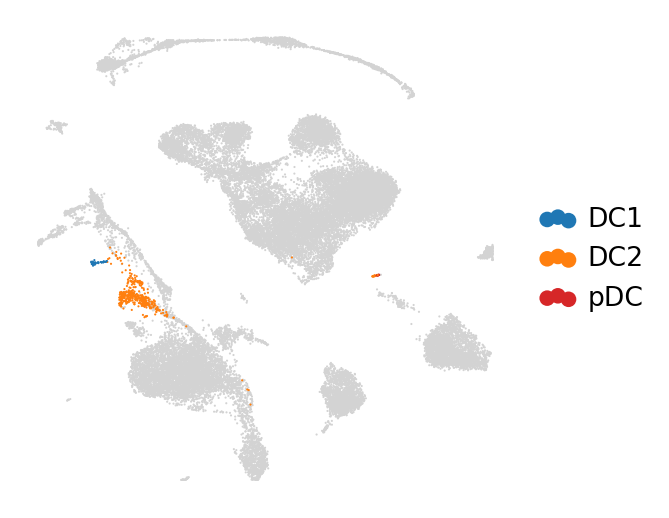

In [160]:
sc.pl.embedding(adata_aligned, basis='X_umap_drvi', color=['Subset status'], groups=['DC1', 'DC2', 'pDC'], 
                title='', frameon=False, show=False, na_in_legend=False)
plt.savefig(output_dir / f'drvi_additional_interesting_latents_umap_annot_DCs.pdf', bbox_inches='tight', dpi=300)
plt.show()

In [161]:
adata_aligned.obs['new_cell_type'] = np.where(
    adata_aligned.obs['Subset status'].isin(['DC1', 'DC2', 'pDC']),
    adata_aligned.obs[cell_type_key].astype(str) + ' -> ' + adata_aligned.obs['Subset status'].astype(str),
    adata_aligned.obs[cell_type_key],
)

In [162]:
adata_aligned.obs['new_cell_type'].value_counts()

new_cell_type
CD4+ T cells                               11011
CD14+ Monocytes                             6338
CD20+ B cells                               2873
NKT cells                                   2745
NK cells                                    2294
CD8+ T cells                                2183
Erythrocytes                                1502
CD16+ Monocytes                              825
HSPCs                                        473
Erythroid progenitors                        463
Monocyte-derived dendritic cells -> DC2      430
Monocyte progenitors                         428
Megakaryocyte progenitors                    270
Plasmacytoid dendritic cells                 265
CD10+ B cells                                207
Plasma cells                                 129
Monocyte-derived dendritic cells -> DC1       41
Monocyte-derived dendritic cells -> pDC        7
Name: count, dtype: int64

In [163]:
ct_order = [
    'Monocyte-derived dendritic cells' + ' -> ' + 'DC1',
    'Monocyte-derived dendritic cells' + ' -> ' + 'DC2',
    'Monocyte-derived dendritic cells' + ' -> ' + 'pDC',
    'Plasmacytoid dendritic cells',
]

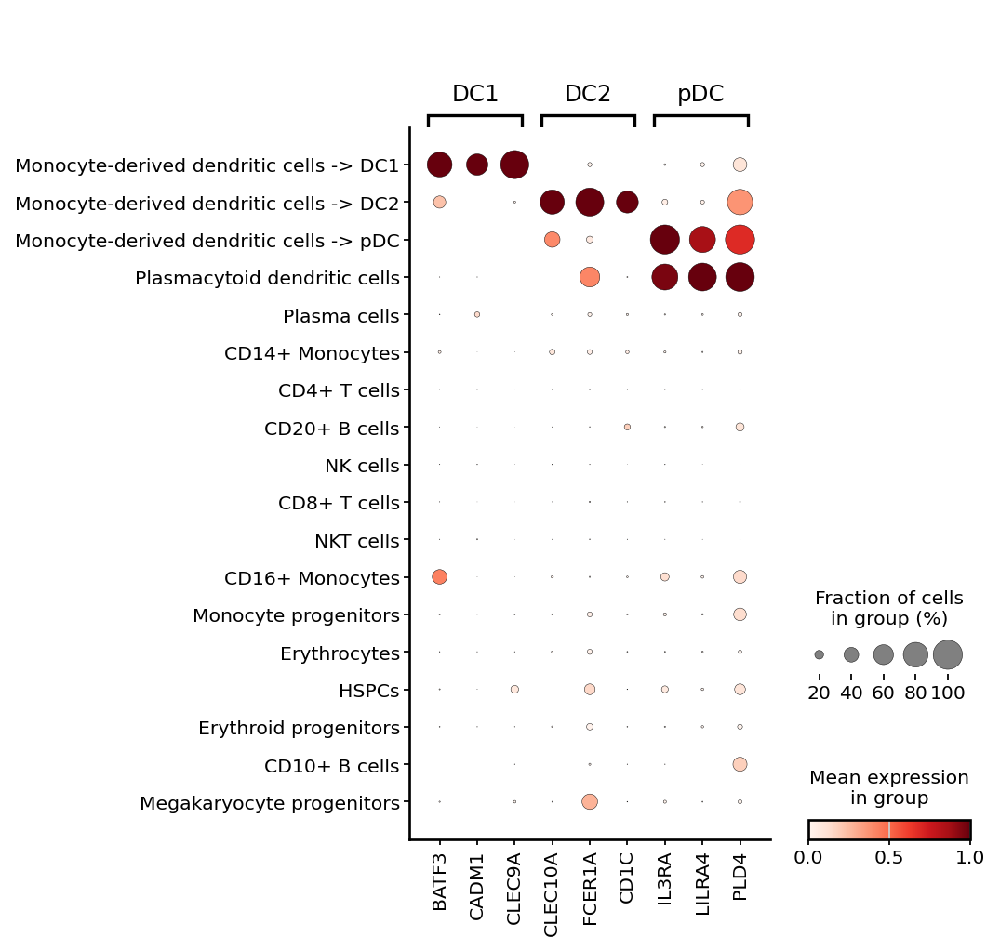

In [164]:
marker_genes_for_mast = {
    'DC1': ['BATF3', 'CADM1', 'CLEC9A'],
    'DC2': ['CLEC10A', 'FCER1A', 'CD1C'],
    'pDC': ['IL3RA', 'LILRA4', 'PLD4'],
}
sc.pl.dotplot(adata_aligned, marker_genes_for_mast, groupby='new_cell_type', standard_scale='var', layer='log1p',
              categories_order=ct_order + [c for c in adata_aligned.obs['new_cell_type'].unique() if c not in ct_order], show=False)
plt.savefig(output_dir / f'drvi_additional_interesting_latents_dotplot_DCs.pdf', bbox_inches='tight', dpi=300)
plt.show()

## SMI plot and finer concepts by DRVI

In [56]:
version = DiscreteDisentanglementBenchmark.version
bench_filename = run_paths['DRVI'] / f'disentanglement_metrics_{version}.pkl'
bench = DiscreteDisentanglementBenchmark.load(
    bench_filename, embed.X, discrete_target=embed.obs[cell_type_key], one_hot_target=None,
)
smi_df = bench.get_results_details()['SMI']
smi_df.index = embed.var['title']
# smi_df = smi_df.loc[smi_df.max(axis=1).sort_values(ascending=False).index]
smi_df.iloc[:3, :3]

,CD4+ T cells,CD8+ T cells,CD10+ B cells
title,,,
DR 11,0.069046,0.456926,0.026600
DR 3,0.362588,0.050967,0.157213
DR 26,0.057778,0.024297,0.037300


In [57]:
df = smi_df.T
cost_matrix = -df.values
max_size = max(cost_matrix.shape)
padded = np.full((max_size, max_size), fill_value=0.0)
padded[:cost_matrix.shape[0], :cost_matrix.shape[1]] = cost_matrix
# Compute optimal assignment
row_ind, col_ind = linear_sum_assignment(padded)

row_names = list(df.index)
col_names = list(df.columns)
assigned_rows = [row_names[i] for i in row_ind if i < len(row_names)]
assigned_cols = [col_names[j] for j in col_ind if j < len(col_names)]

df = df.loc[assigned_rows, assigned_cols].T

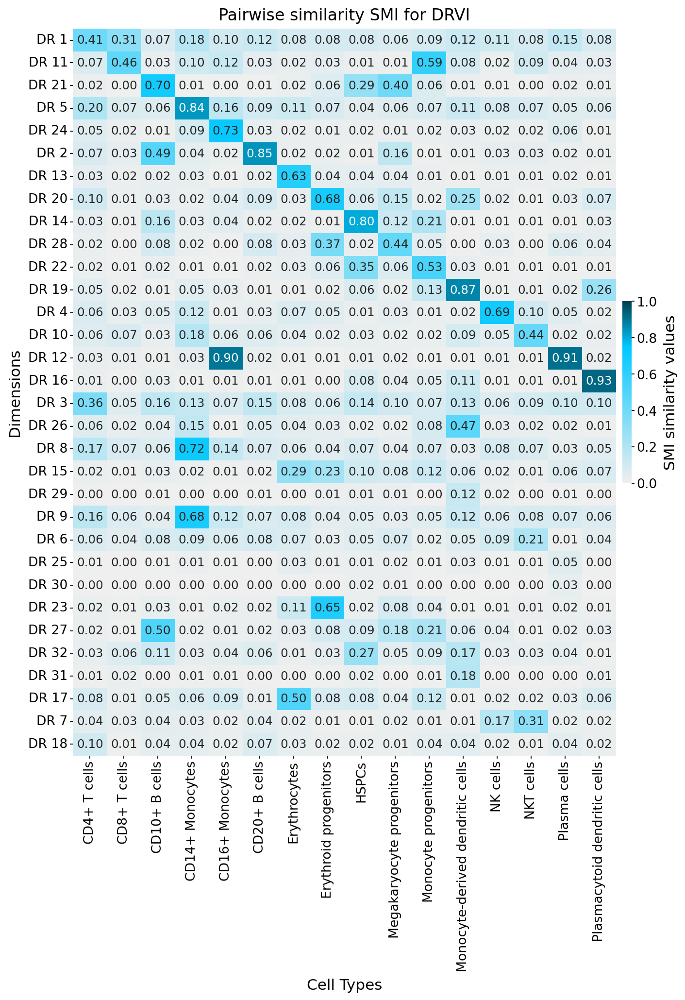

In [58]:
plt.figure(figsize=(df.shape[1] / 1.5, df.shape[0] / 2.6))
ax = sns.heatmap(
    df,
    annot=True,
    fmt=".2f",
    cmap=drvi.utils.plotting.cmap.saturated_just_sky_cmap,
    linewidths=0.,
    cbar=True,
    cbar_kws={
        'label': f'SMI similarity values',
        'pad': 0.01, 'shrink': 0.25,
    },
    vmin=0.,
    vmax=1,
)
ax.grid(False)

plt.title(f"Pairwise similarity SMI for DRVI")
plt.xlabel("Cell Types")
plt.ylabel("Dimensions")
plt.xticks(rotation=90)
plt.yticks(rotation=0)

plt.savefig(output_dir / f'smi_pairwise.pdf', bbox_inches='tight', dpi=300)
plt.show()

In [65]:
dim_subset = ['DR 1+', 'DR 3+', 'DR 11-']

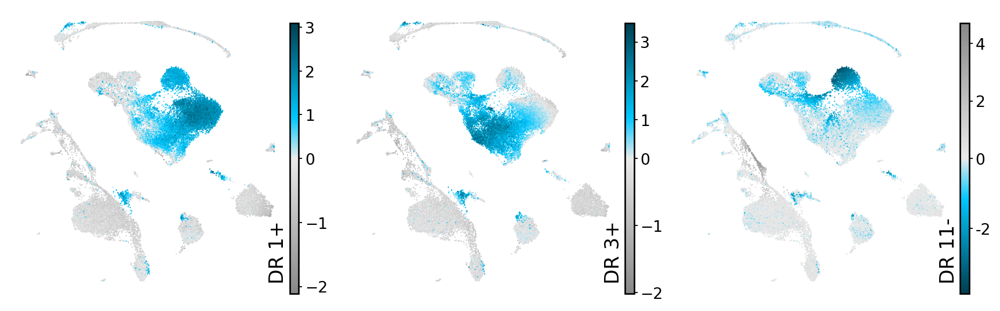

In [66]:
fig = drvi.utils.pl.plot_latent_dims_in_umap(embed, directional=True, ncols=3, show=False, wspace=0.1, hspace=0.25, color_bar_rescale_ratio=0.95,
                                             dim_subset=dim_subset, cmap=more_gray_saturated_sky_cmap)
fig.savefig(output_dir / f'drvi_additional_interesting_latents_on_umap_t_subtype_1.pdf', bbox_inches='tight', dpi=300)
plt.show()

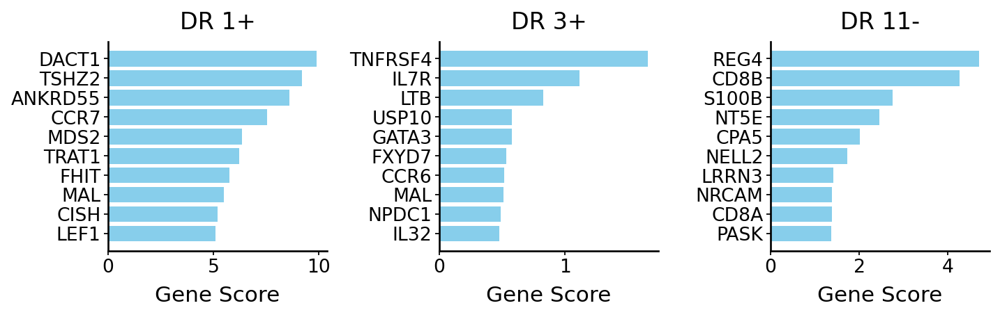

In [67]:
fig = model.plot_interpretability_scores(embed, adata, score_threshold=0.1, ncols=6, show=False,
                                         dim_subset=dim_subset)
fig.savefig(output_dir / f'drvi_additional_interesting_latents_interpretability_t_subtype_1.pdf', bbox_inches='tight', dpi=300)
plt.show()

In [71]:
dim_subset = ['DR 10+', 'DR 7-', 'DR 6+']

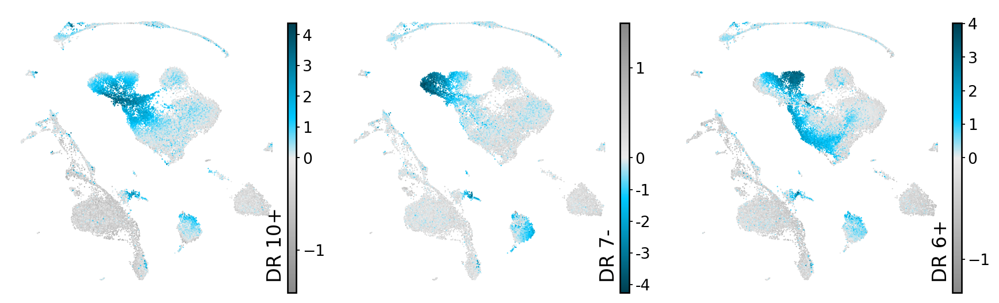

In [72]:
fig = drvi.utils.pl.plot_latent_dims_in_umap(embed, directional=True, ncols=3, show=False, wspace=0.1, hspace=0.25, color_bar_rescale_ratio=0.95,
                                             dim_subset=dim_subset, cmap=more_gray_saturated_sky_cmap)
fig.savefig(output_dir / f'drvi_additional_interesting_latents_on_umap_t_subtype_2.pdf', bbox_inches='tight', dpi=300)
plt.show()

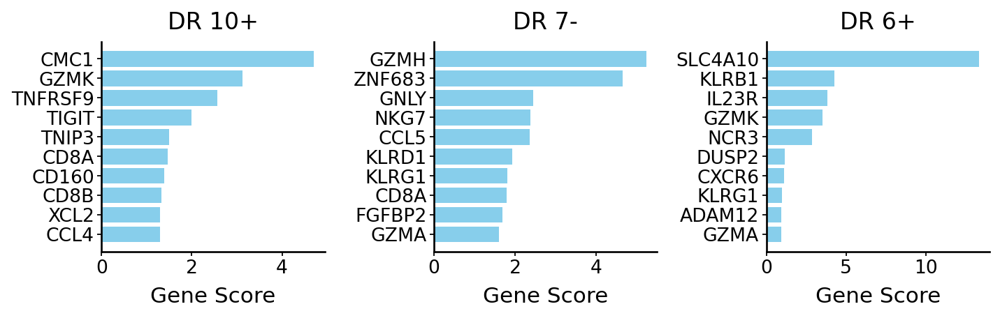

In [73]:
fig = model.plot_interpretability_scores(embed, adata, score_threshold=0.1, ncols=6, show=False,
                                         dim_subset=dim_subset)
fig.savefig(output_dir / f'drvi_additional_interesting_latents_interpretability_t_subtype_2.pdf', bbox_inches='tight', dpi=300)
plt.show()